## Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import muon as mu
import scanpy as sc
import mofax
import anndata as ad
from scipy.stats import pearsonr
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scanpy.plotting import palettes

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


## Define some paths

In [2]:
# Define the folder containing data.
data_folder = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/data/"

# Define the folder where to save figures.
fig_folder = "/users/csb/huizing/Documents/PhD/Code/"
fig_folder += "mowgli_reproducibility/visualize/figures/"

# Define the folder for enrichment results.
enrich_folder = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/"

# Define the folder containing Mowgli's embeddings.
w_folder = "/users/csb/huizing/Documents/PhD/Code/Mowgli/local_analysis/from_jz/w/"

# Define the folder containing Mowgli's loadings.
h_folder = "/users/csb/huizing/Documents/PhD/Code/Mowgli/local_analysis/from_jz/h/"

## Loading the data

In [3]:
# Load the raw RNA signal.
rna_all_genes = mu.read_10x_h5(
    data_folder
    + "TEA/GSM4949911_X061-AP0C1W1_leukopak_perm-cells_"
    + "tea_fulldepth_cellranger-arc_filtered_feature_bc_matrix.h5",
    extended=False,
)["rna"]

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
azimuth_pred = pd.read_csv(data_folder + "TEA/azimuth_pred.tsv", sep="\t", index_col=0)

In [5]:
# Compute quality control metrics and perform basic preprocessing.
rna_all_genes.var["mt"] = rna_all_genes.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    rna_all_genes,
    qc_vars=["mt"],
    percent_top=None,
    log1p=False,
    inplace=True,
)
mu.pp.filter_obs(rna_all_genes, "n_genes_by_counts", lambda x: (x >= 500) & (x < 4_500))
mu.pp.filter_obs(rna_all_genes, "total_counts", lambda x: x < 12_000)
mu.pp.filter_obs(rna_all_genes, "pct_counts_mt", lambda x: x < 30)
mu.pp.filter_var(rna_all_genes, "n_cells_by_counts", lambda x: x >= 10)
sc.pp.normalize_total(rna_all_genes, target_sum=1e4)  # Perform per-cell normalization.
sc.pp.log1p(rna_all_genes)  # Log-transform the counts.

# Load the preprocessed data.
mdata = mu.read_h5mu(data_folder + "TEA/tea_preprocessed.h5mu.gz")

# Load the MOFA model.
mofa_model = mofax.mofa_model(data_folder + "TEA/tea_mofa_15.hdf5")
mdata.obsm["X_mofa"] = mofa_model.get_factors()

# Load the Mowgli model.
mdata.obsm["X_mowgli"] = np.load(
    w_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()["W"]

# This is needed somehow.
mdata.uns = {}

# Subset rna_all_genes to the cells in mdata.
rna_all_genes = rna_all_genes[mdata["rna"].obs_names]
rna_all_genes.var_names_make_unique()

# Load MOFA+'s loadings.
H_mofa = {
    "H_rna": mofa_model.get_weights("rna"),
    "H_atac": mofa_model.get_weights("atac"),
    "H_adt": mofa_model.get_weights("adt"),
}

# Load Mowgli's loadings.
H_mowgli = np.load(
    h_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
# Define the method used for enrichement.
enrichment_file = "gprofiler"  # or "fgsea" or "enrichr"

# Get fgsea results.
if enrichment_file == "fgsea":

    # Load the fgsea results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "fgsea.csv", index_col=0)
    cols = {"pathway": "native", "col": "dim", "pval": "p_value"}
    enr.rename(columns=cols, inplace=True)
    enr["dim"] = enr["dim"].str.replace("X", "").astype(int)

# Get gprofiler results.
elif enrichment_file == "gprofiler":

    # Load the gprofiler results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "enrichment.csv", index_col=0)
    enr["dim"] = enr["query"].str.split(" ", expand=True)[1].astype(int)

# Get enrichr results.
elif enrichment_file == "enrichr":

    # Load the enrichr results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "enrichr.csv", index_col=0)
    enr.rename(columns={"path_name": "native", "adj_p_val": "p_value"}, inplace=True)

# Add some more columns.
enr["name"] = enr["native"]
enr = enr[enr["p_value"] < 0.05]
enr["minlogp"] = -np.log10(enr["p_value"])

In [7]:
all_motifs = pd.DataFrame({})

# Mowgli
motifs_path = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/top_motifs_mowgli/"
for i in range(50):
    motifs = pd.read_csv(motifs_path + f"motifs_{i}.csv", index_col=0)
    motifs = motifs[motifs["p.adjust"] < .05]
    motifs = motifs[motifs["motif"].str.startswith("MA")]
    motifs["dim"] = i
    motifs["method"] = "mowgli"
    all_motifs = pd.concat((all_motifs, motifs))

all_motifs["minlogp"] = -np.log10(all_motifs["p.adjust"])

In [8]:
rna_all_genes.var_names = ["rna:" + x for x in rna_all_genes.var_names]

In [9]:
mdata.obs[azimuth_pred.columns] = azimuth_pred.loc[mdata.obs_names]

In [10]:
mdata.obs[mdata["adt"].var_names] = mdata["adt"].X
mdata.obs[[f"mofa:{i}" for i in range(15)]] = mdata.obsm["X_mofa"]
mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]

<ipython-input-10-ad181353b2b9>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]
<ipython-input-10-ad181353b2b9>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]
<ipython-input-10-ad181353b2b9>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

## Plotting the data

In [11]:
# Compute the UMAP embedding
sc.pp.neighbors(mdata, n_neighbors=25, key_added="mofa_neighbors", use_rep="X_mofa")
sc.tl.leiden(mdata, resolution=0.2, key_added="mofa_leiden", neighbors_key="mofa_neighbors")
sc.tl.umap(mdata, neighbors_key="mofa_neighbors")
mdata.obsm["X_umap_mofa"] = mdata.obsm["X_umap"]

/users/csb/huizing/anaconda3/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


In [12]:
# Compute the UMAP embedding
sc.pp.neighbors(mdata, n_neighbors=25, key_added="mowgli_neighbors", use_rep="X_mowgli")
sc.tl.leiden(mdata, resolution=0.2, key_added="mowgli_leiden", neighbors_key="mowgli_neighbors")
sc.tl.umap(mdata, neighbors_key="mowgli_neighbors")
mdata.obsm["X_umap_mowgli"] = mdata.obsm["X_umap"]

/users/csb/huizing/anaconda3/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


In [13]:
# Annotate the MOFA+ embedding.
mofa_cluster_names = {
    0: "CD4 T cells",
    1: "B cells",
    2: "CD4 T cells",
    3: "Monocytes",
    4: "CD8 T cells",
    5: "NK cells",
    6: "CD8 T cells",
    7: "MAIT T cells",
    8: "B cells",
    9: "Erythroid cells",
}
codes = mdata.obs["mofa_leiden"].cat.codes
mdata.obs["annotation_mofa"] = [mofa_cluster_names[c] for c in codes]

<ipython-input-13-e13a85b26ee1>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs["annotation_mofa"] = [mofa_cluster_names[c] for c in codes]


In [14]:
# Annotate the Mowgli embedding.
mowgli_cluster_names = {
    0: "B cells",
    1: "CD4 T cells",
    2: "CD4 T cells",
    3: "CD8 T cells",
    4: "CD4 T cells",
    5: "Monocytes",
    6: "NK cells",
    7: "MAIT T cells",
    8: "Erythroid cells",
}
codes = mdata.obs["mowgli_leiden"].cat.codes
mdata.obs["annotation_mowgli"] = [mowgli_cluster_names[c] for c in codes]

<ipython-input-14-4d0d9bcca83a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs["annotation_mowgli"] = [mowgli_cluster_names[c] for c in codes]


/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'predicted.celltype.l2' as categorical
/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'predicted.celltype.l3' as categorical
/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be 

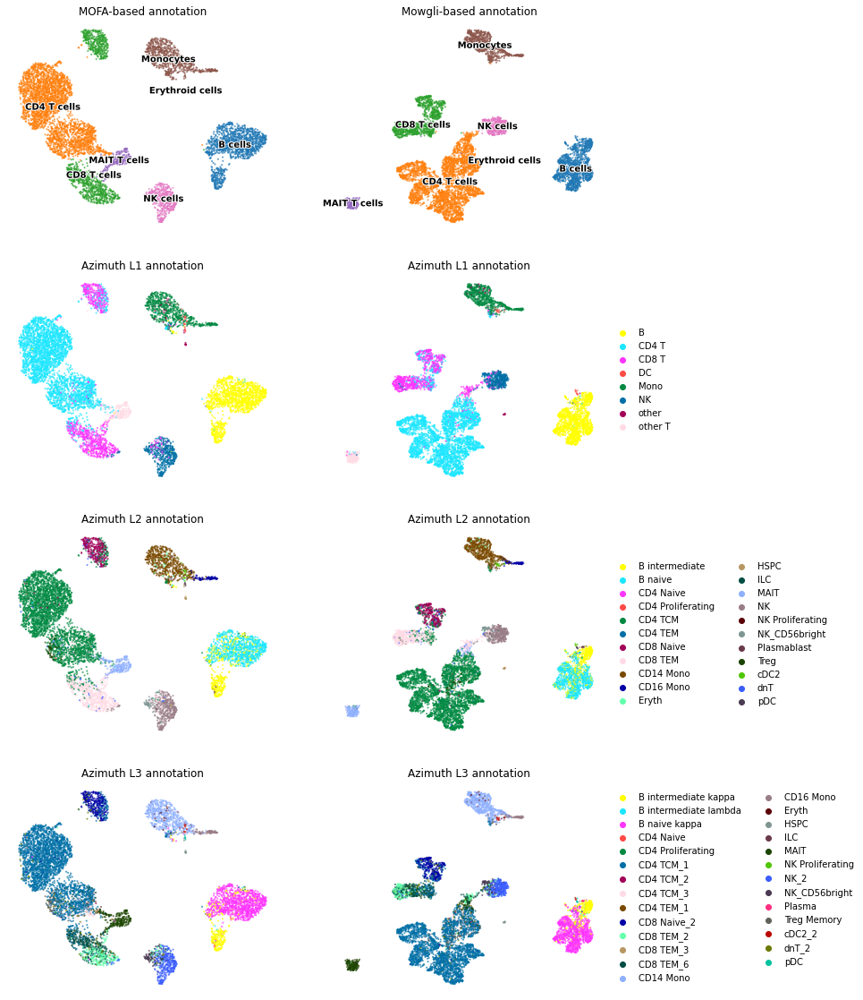

In [15]:
fig, axes = plt.subplots(4, 2, figsize=(12, 4*5))
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    color="annotation_mofa",
    title="MOFA-based annotation",
    legend_loc="on data",
    legend_fontoutline=2,
    alpha=0.7,
    frameon=False,
    ax=axes[0, 0],
    show=False,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    color="annotation_mowgli",
    title="Mowgli-based annotation",
    legend_loc="on data",
    frameon=False,
    legend_fontoutline=2,
    alpha=0.7,
    ax=axes[0, 1],
    show=False,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    color="predicted.celltype.l1",
    title="Azimuth L1 annotation",
    legend_loc="none",
    alpha=0.7,
    frameon=False,
    ax=axes[1, 0],
    show=False,
    palette=palettes.default_102,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    color="predicted.celltype.l1",
    title="Azimuth L1 annotation",
    frameon=False,
    alpha=0.7,
    ax=axes[1, 1],
    show=False,
    palette=palettes.default_102,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    color="predicted.celltype.l2",
    title="Azimuth L2 annotation",
    legend_loc="none",
    alpha=0.7,
    frameon=False,
    ax=axes[2, 0],
    show=False,
    palette=palettes.default_102,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    color="predicted.celltype.l2",
    title="Azimuth L2 annotation",
    frameon=False,
    alpha=0.7,
    ax=axes[2, 1],
    show=False,
    palette=palettes.default_102,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    color="predicted.celltype.l3",
    title="Azimuth L3 annotation",
    legend_loc="none",
    alpha=0.7,
    frameon=False,
    ax=axes[3, 0],
    show=False,
    palette=palettes.default_102,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    color="predicted.celltype.l3",
    title="Azimuth L3 annotation",
    frameon=False,
    alpha=0.7,
    ax=axes[3, 1],
    show=False,
    palette=palettes.default_102,
)
plt.show()


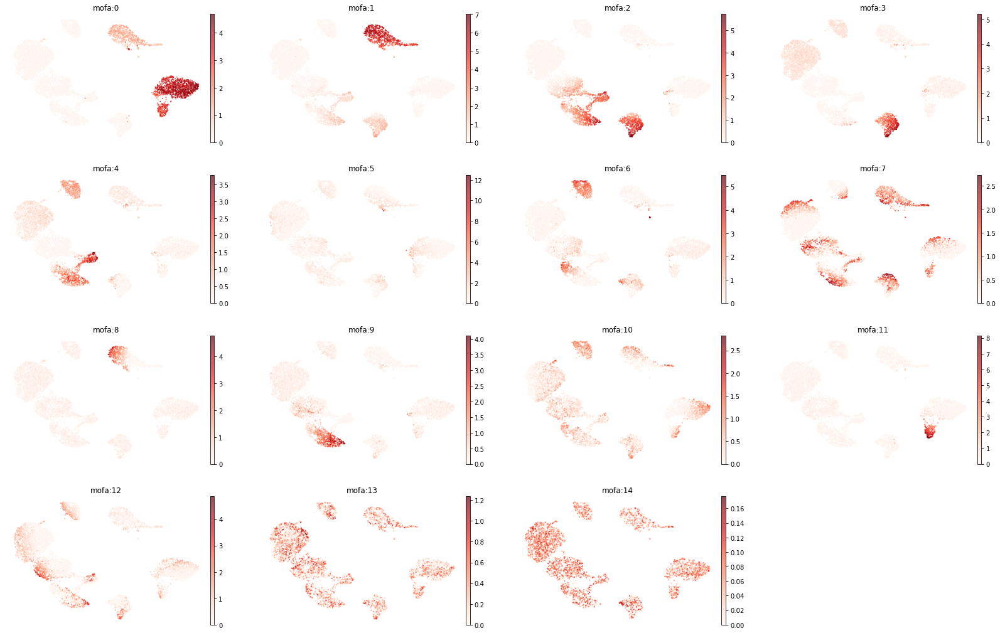

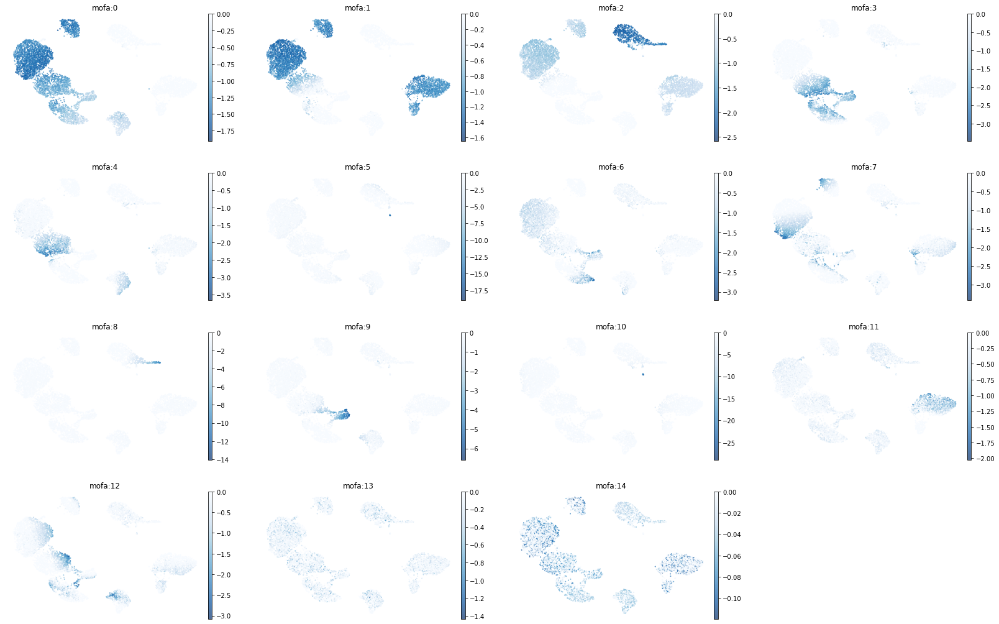

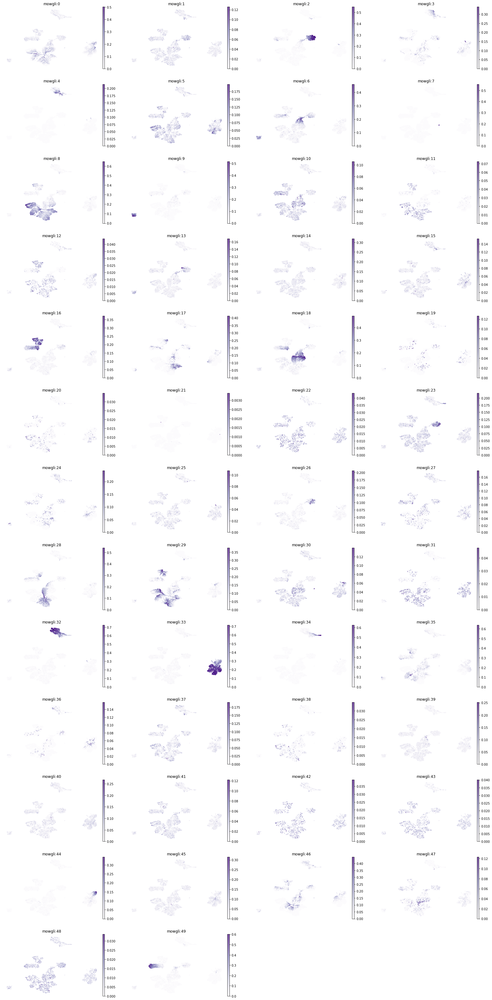

In [16]:
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    alpha=0.7,
    color=[f"mofa:{i}" for i in range(15)],
    legend_fontoutline=2,
    frameon=False,
    color_map="Reds",
    vmin=0,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mofa",
    alpha=0.7,
    color=[f"mofa:{i}" for i in range(15)],
    legend_fontoutline=2,
    frameon=False,
    color_map="Blues_r",
    vmax=0,
)
sc.pl.embedding(
    mdata,
    basis="X_umap_mowgli",
    alpha=0.7,
    color=[f"mowgli:{i}" for i in range(50)],
    legend_fontoutline=2,
    frameon=False,
    color_map="Purples",
)


## Plot Mowgli

In [17]:
H_adt = ad.AnnData(H_mowgli["H_adt"])
H_adt.X /= H_adt.X.sum(axis=1, keepdims=True)
H_adt.obs_names = mdata["adt"].var_names.str.replace("adt:", "")

H_rna = ad.AnnData(H_mowgli["H_rna"])
H_rna.X /= H_rna.X.sum(axis=1, keepdims=True)
H_rna.obs_names = mdata["rna"].var_names.str.replace("rna:", "")

H_atac = ad.AnnData(H_mowgli["H_atac"])
H_atac.X /= H_atac.X.sum(axis=1, keepdims=True)
H_atac.obs_names = mdata["atac"].var_names.str.replace("atac:", "")

In [24]:
print("\n".join(H_rna.obs_names[H_rna.X[:, 3].argsort()[::-1][:100]]))

PTGER4
GNA12
LMNA
HLA-DPB1
LDLR
SH3BP5
LYZ
MICU1
HAVCR2
PID1
MYO1F
PLEKHG2
VCAN
SLC7A5
HLA-DRA
HDAC9
COTL1
GABPB1
SLC43A2
RAP1GAP2
JAZF1
RBM47
EEPD1
PDE4B
CTSB
SPI1
HLA-DRB1
GAB2
CD74
IL3RA
FTH1
ADAM9
SMAD3
SULF2
WDFY4
HLA-DQB1
LYN
CSF2RA
ZEB2
TRIO
FAM49A
TNFRSF1B
MEF2A
ARHGAP24
CD4
AC020916.1
TIGAR
GNAQ
AFF3
PPCDC
ADAM28
RUBCNL
EIF4G3
RXRA
LINC01588
PSAP
SQSTM1
PIK3R1
TCF4
PLIN2
BABAM2
IFI30
LDLRAD4
AUTS2
TANK
BANK1
MAN1A1
PLEK
RAB31
CDK14
PLCB1
SAMHD1
SAT1
PLXDC2
ID2
TFRC
LRMDA
PBX3
NEDD9
DNMBP
MS4A1
SLC8A1
ATG2A
FCHSD2
LONRF3
ITGB1
GNG7
UBE2E2
CST3
EIF2AK3
ATP2B1
AHNAK
CD22
GRAMD1B
HLA-DQA1
SIPA1L1
CD83
ACSL1
ABCA1
MARCH1


In [18]:
def plot_zoom(dim:int, zoom_into_cluster:str, **kwargs):
    idx_zoom = mdata.obs["annotation_mowgli"].str.contains(zoom_into_cluster)
    fig, axes = plt.subplots(2, 3, figsize=(20, 9))
    sc.pl.umap(
        mdata,
        alpha=0.7,
        color=[f"mowgli:{dim}"],
        # color="annotation_mowgli",
        legend_loc=None,
        title=f"Mowgli factor {dim}",
        legend_fontoutline=2,
        frameon=False,
        show=False,
        ax=axes[0, 0],
    )
    fig.axes[-1].remove()

    axins = inset_axes(
        axes[0, 0],
        "40%",
        "60%",
        borderpad=3,
        loc="upper left",
        bbox_to_anchor=(0.4, 0, 1, 1),
        bbox_transform=axes[0, 0].transAxes,
    )
    sc.pl.umap(
        mdata[idx_zoom],
        alpha=0.7,
        color=[f"mowgli:{dim}"],
        legend_loc=None,
        legend_fontoutline=2,
        # frameon=False,
        show=False,
        ax=axins,
        **kwargs,
    )

    obsm = mdata[idx_zoom].obsm["X_umap"]
    x1, x2 = np.percentile(obsm[:, 0], 1) - 1, np.percentile(obsm[:, 0], 99) + 1.5
    y1, y2 = np.percentile(obsm[:, 1], 1) - 1, np.percentile(obsm[:, 1], 99) + 1.5
    # x1, x2, y1, y2 = 12, 18, -6, 3
    axins.set_xlim(x1, x2)
    axins.set_ylim(y1, y2)
    axins.set_title(None)
    axins.set_xlabel(None)
    axins.set_ylabel(None)
    axins.set_facecolor((1, 1, 1, .75))
    rect, lines = axes[0, 0].indicate_inset_zoom(axins)
    lines[0].set_visible(True)
    lines[1].set_visible(True)
    lines[2].set_visible(True)
    lines[3].set_visible(True)

    fig.axes[7].remove()

    idx = np.argsort(H_rna.X[:, dim])[::-1][:15]
    sns.barplot(
        y=H_rna.obs_names[idx],
        x=H_rna.X[idx, dim],
        ax=axes[0, 1],
        palette="Blues_r",
    )
    axes[0, 1].set_title(f"RNA weights for factor {dim}")

    idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
    sns.barplot(
        y=H_adt.obs_names[idx],
        x=H_adt.X[idx, dim],
        ax=axes[0, 2],
        palette="Blues_r",
    )
    axes[0, 2].set_title(f"ADT weights for factor {dim}")

    axes[1, 0].remove()

    idx = enr["source"] == "GO_Biological_Process_2021"
    idx &= enr["dim"] == dim
    df = enr[idx].sort_values("minlogp", ascending=False).head(15)
    if np.sum(idx) > 0:
        sns.barplot(
            data=df,
            x="minlogp",
            y=df["name"].apply(lambda x: x[:-13]),
            ax=axes[1, 1],
            palette="Blues_r",
            estimator=max,
            ci=None,
        )
        axes[1, 1].set_title(f"Gene set enrichment for factor {dim}")
        axes[1, 1].set_ylabel(None)
    else:
        axes[1, 1].remove()

    idx = all_motifs["dim"] == dim
    if np.sum(idx) > 0:
        sns.barplot(
            data=all_motifs[idx].head(15),
            y="motif.name",
            x="minlogp",
            ax=axes[1, 2],
            palette="Blues_r",
        )
        axes[1, 2].set_title(f"Motif enrichment for factor {dim}")
        axes[1, 2].set_ylabel(None)
    else:
        axes[1, 2].remove()

    plt.show()

# def plot_zoom(dim:int, zoom_into_cluster:str, **kwargs):
#     idx_zoom = mdata.obs["annotation_mowgli"].str.contains(zoom_into_cluster)
#     fig, axes = plt.subplots(1, 1, figsize=(10, 7))
#     sc.pl.umap(
#         mdata,
#         alpha=0.7,
#         # color="annotation_mowgli",
#         color=f"mowgli:{dim}",
#         legend_loc=None,
#         title=f"Mowgli factor {dim}",
#         legend_fontoutline=2,
#         frameon=False,
#         show=False,
#         ax=axes,
#     )
#     fig.axes[1].remove()
#     axins = inset_axes(
#         axes,
#         "40%",
#         "60%",
#         borderpad=3,
#         loc="upper left",
#         bbox_to_anchor=(0.4, 0, 1, 1),
#         bbox_transform=axes.transAxes,
#     )
#     sc.pl.umap(
#         mdata[idx_zoom],
#         alpha=0.7,
#         color=[f"mowgli:{dim}"],
#         legend_loc=None,
#         legend_fontoutline=2,
#         # frameon=False,
#         show=False,
#         ax=axins,
#         **kwargs,
#     )

#     obsm = mdata[idx_zoom].obsm["X_umap"]
#     x1, x2 = np.percentile(obsm[:, 0], 1) - 1, np.percentile(obsm[:, 0], 99) + 1.5
#     y1, y2 = np.percentile(obsm[:, 1], 1) - 1, np.percentile(obsm[:, 1], 99) + 1.5
#     # x1, x2, y1, y2 = 12, 18, -6, 3
#     axins.set_xlim(x1, x2)
#     axins.set_ylim(y1, y2)
#     axins.set_title(None)
#     axins.set_xlabel(None)
#     axins.set_ylabel(None)
#     axins.set_facecolor((1, 1, 1, .75))
#     rect, lines = axes.indicate_inset_zoom(axins)
#     lines[0].set_visible(True)
#     lines[1].set_visible(True)
#     lines[2].set_visible(True)
#     lines[3].set_visible(True)

#     fig.axes[2].remove()

#     plt.show()


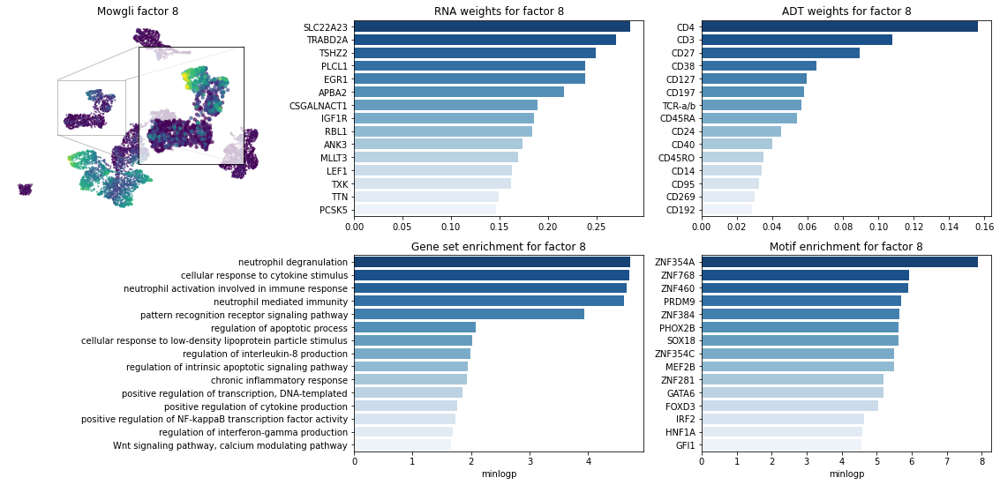

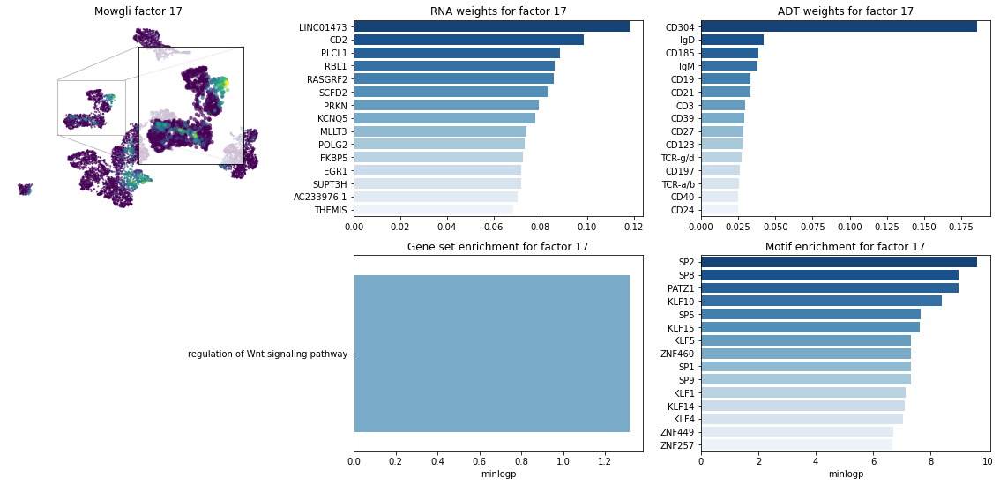

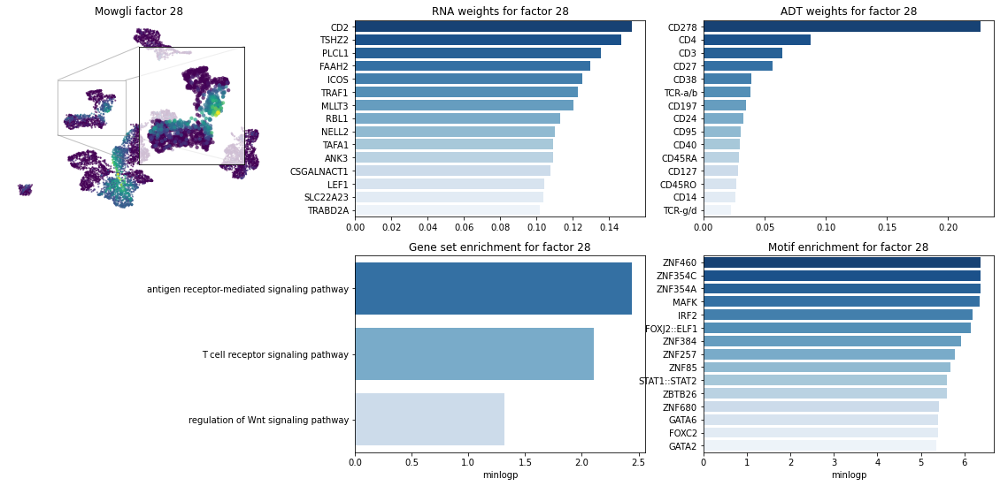

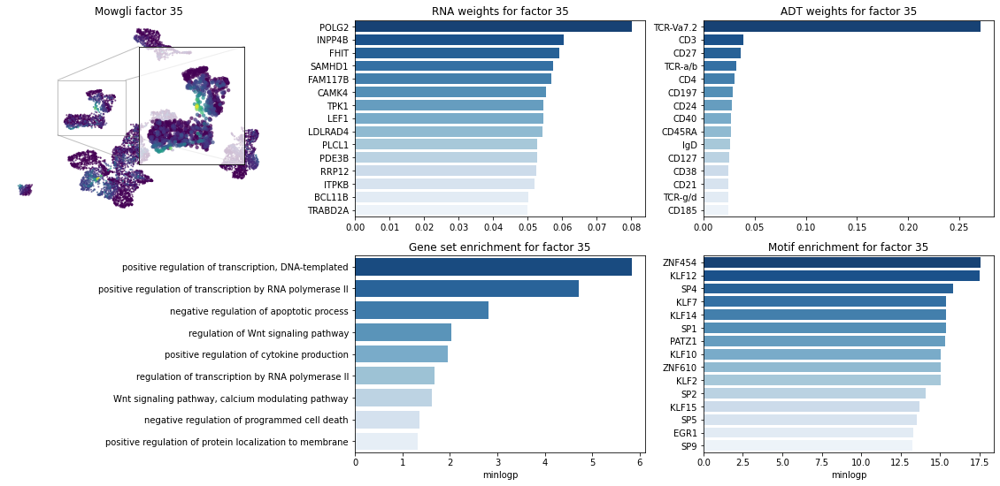

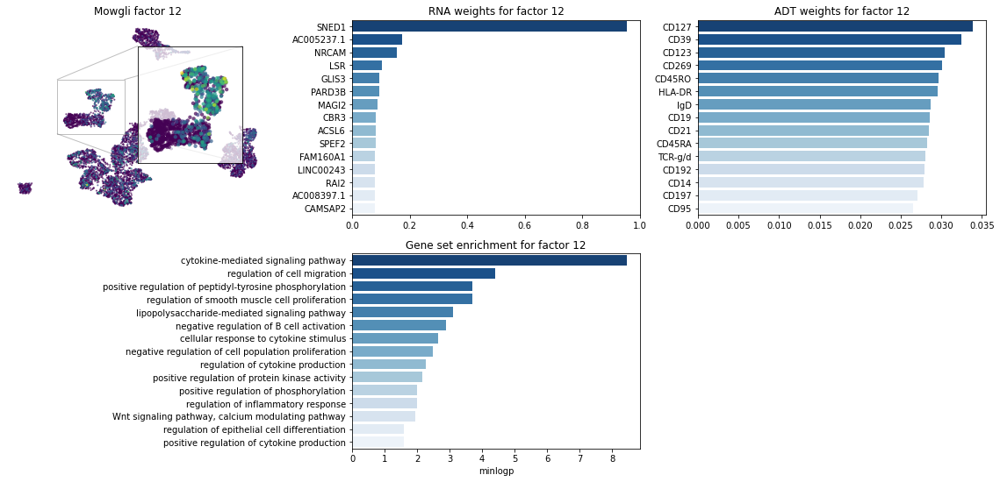

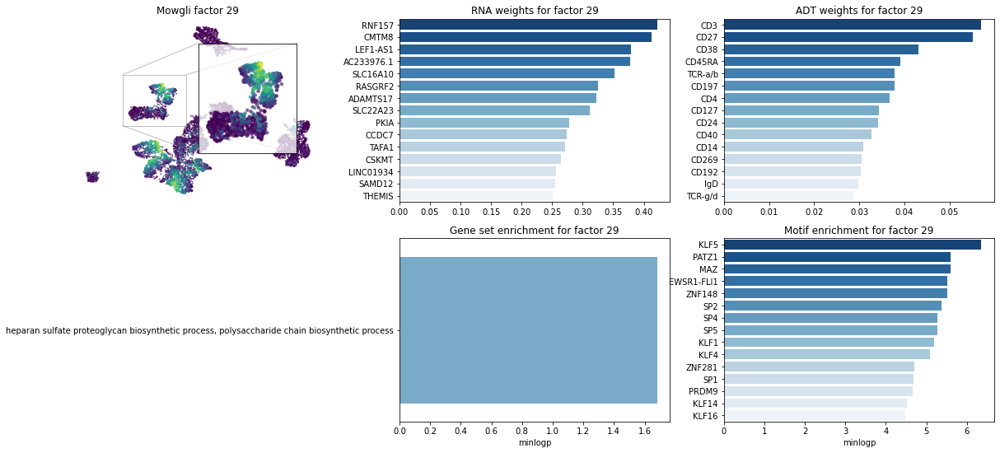

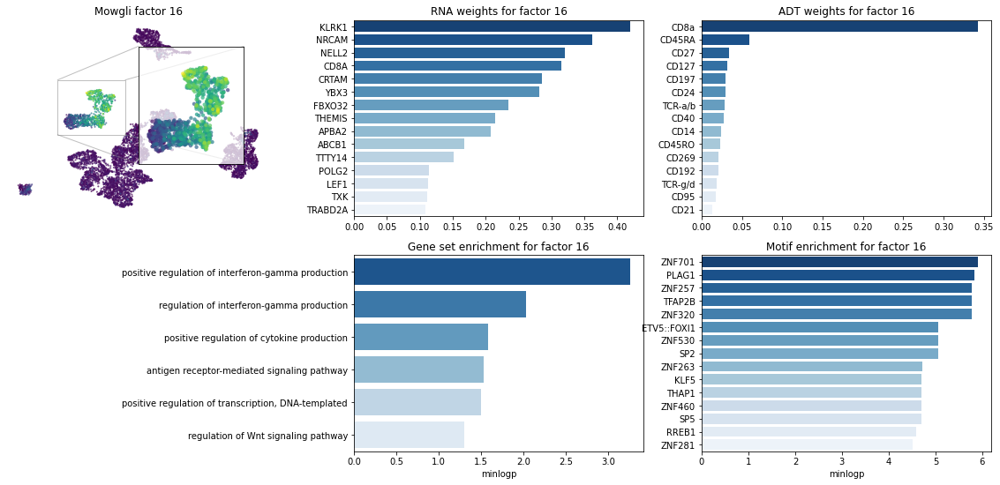

In [19]:
plot_zoom(8, "CD8 T", s=75) # ?
plot_zoom(17, "CD8 T", s=75) # Neuropilin-1 (NRP1) 
plot_zoom(28, "CD8 T", s=75) # CD278 (ICOS)
plot_zoom(35, "CD8 T", s=75) # TCDVa7.2 (bizarre)
plot_zoom(12, "CD8 T", s=75) # CD127, naive?
plot_zoom(29, "CD8 T", s=75)
plot_zoom(16, "CD8 T", s=75)

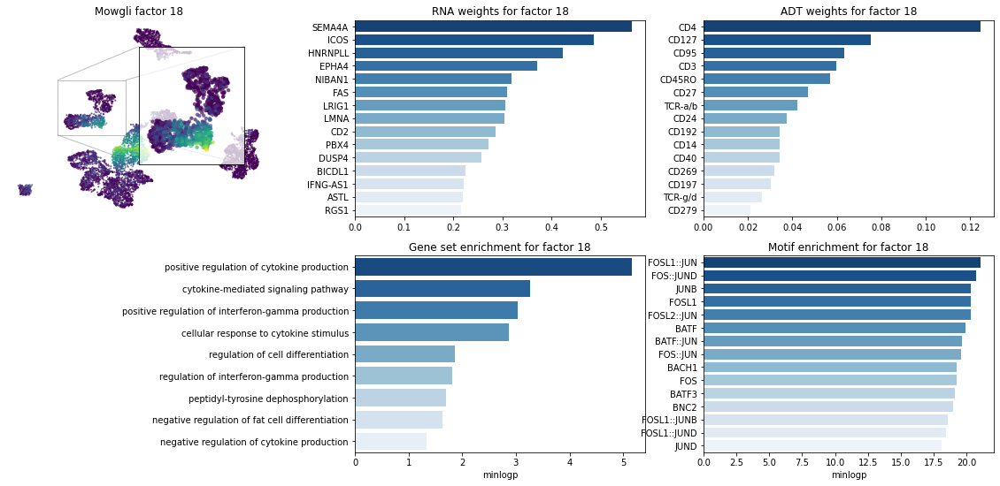

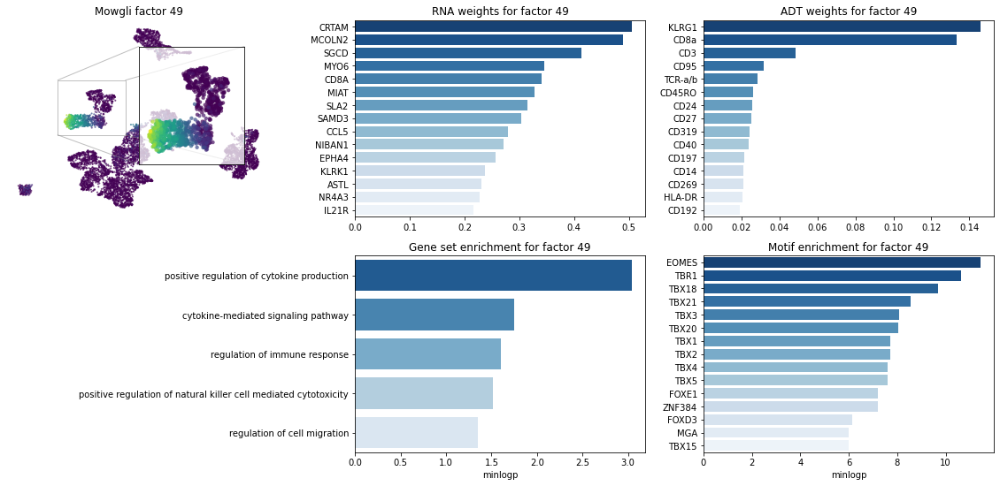

In [20]:
# Effector vs effector memory
plot_zoom(18, "CD8 T", s=75)
plot_zoom(49, "CD8 T", s=75) #TEM

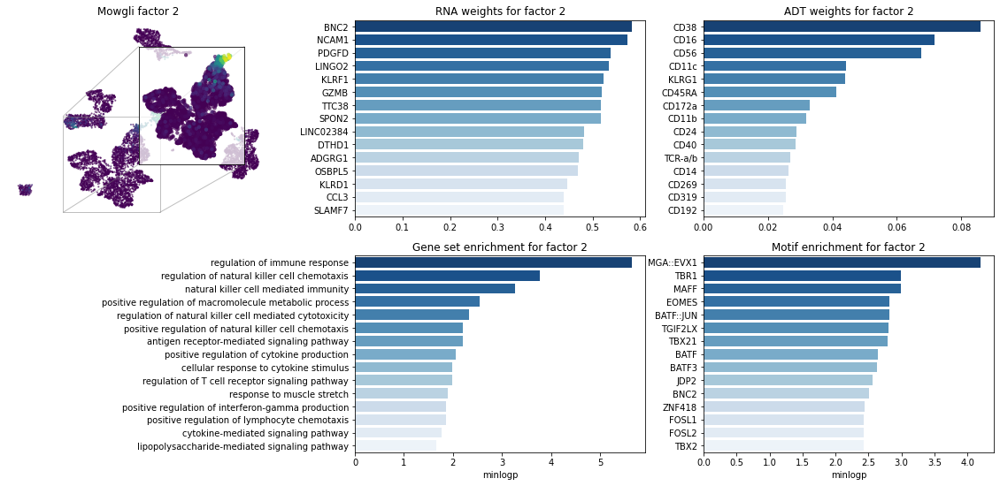

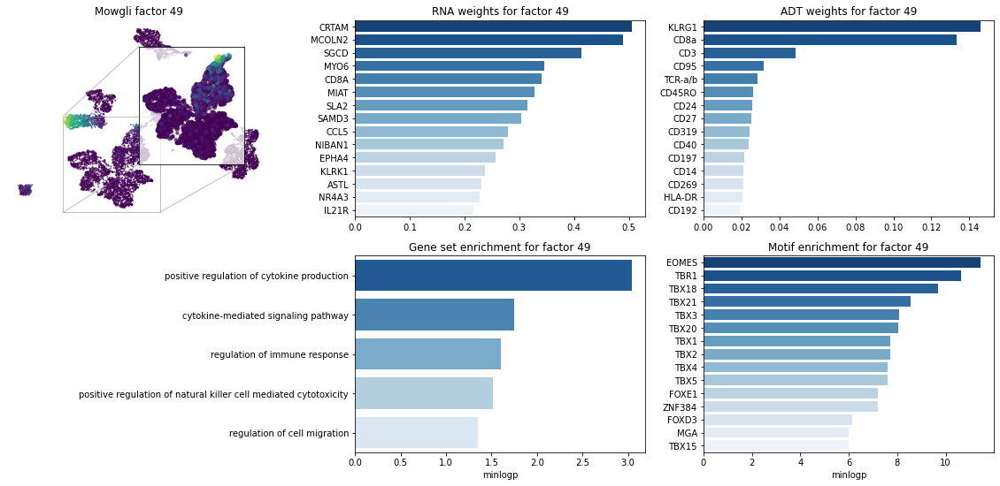

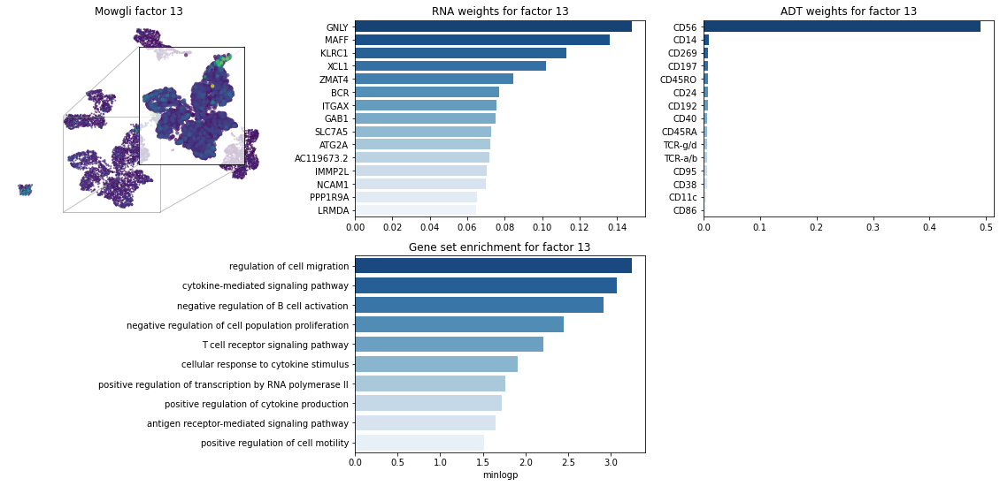

In [21]:
# DNT
plot_zoom(2, "CD4 T", s=75)
plot_zoom(49, "CD4 T", s=75)
plot_zoom(13, "CD4 T", s=75)

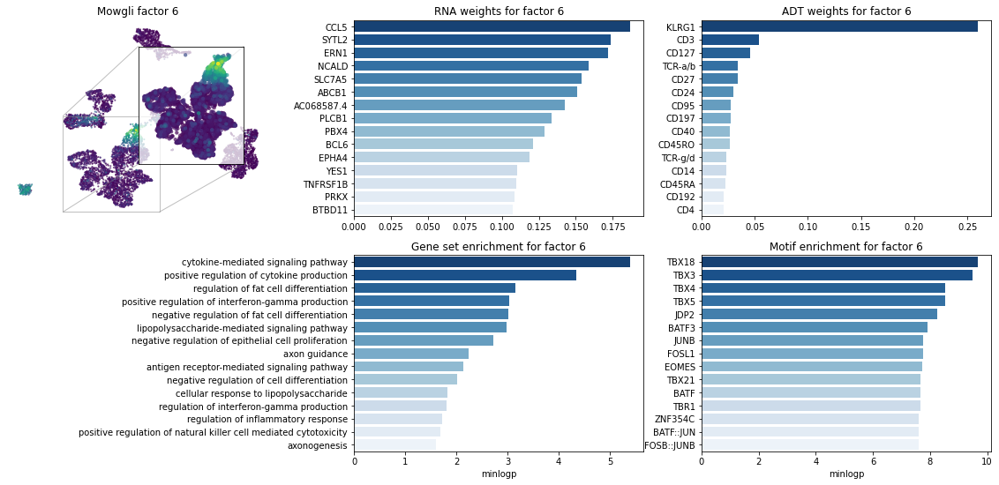

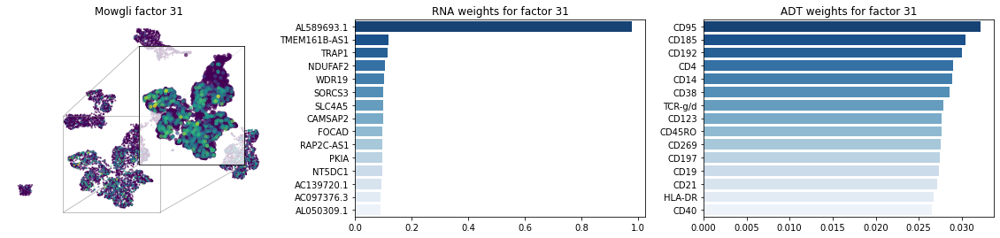

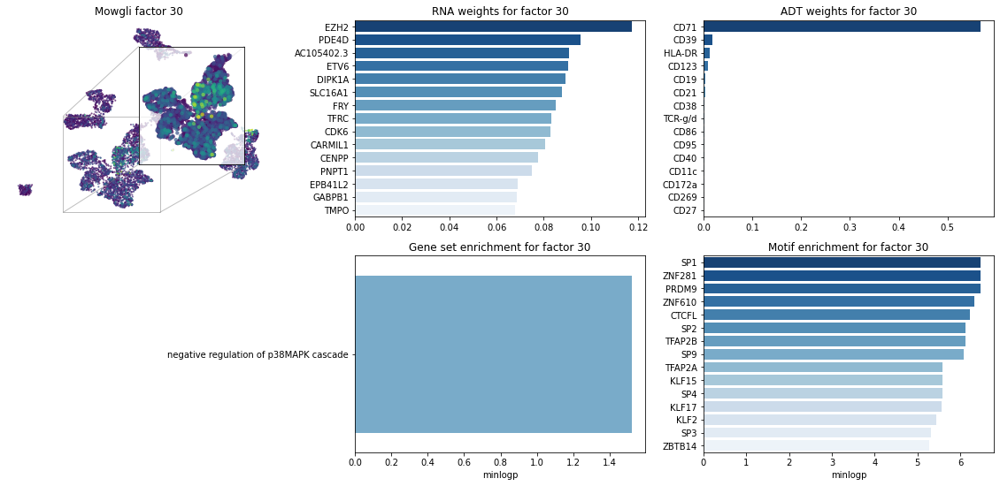

In [22]:
# ? vs ?
plot_zoom(6, "CD4 T", s=75)
plot_zoom(31, "CD4 T", s=75)
plot_zoom(30, "CD4 T", s=75)

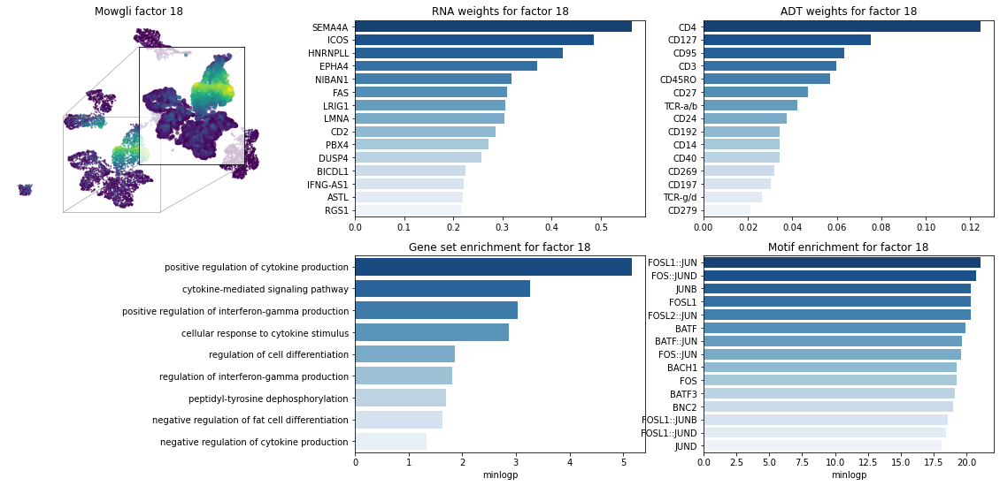

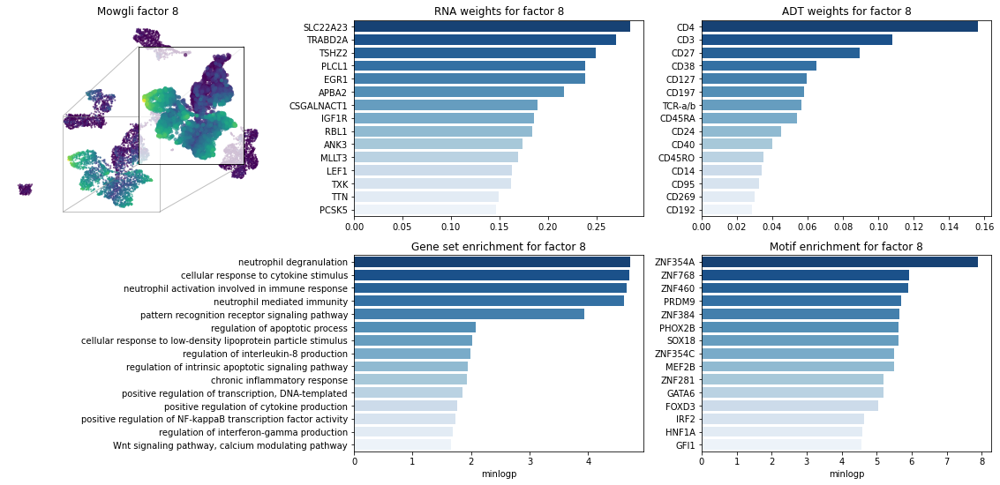

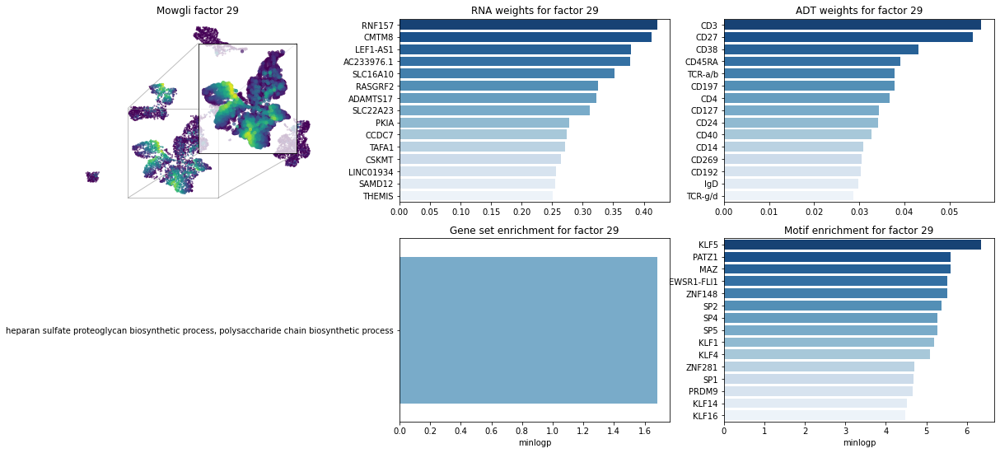

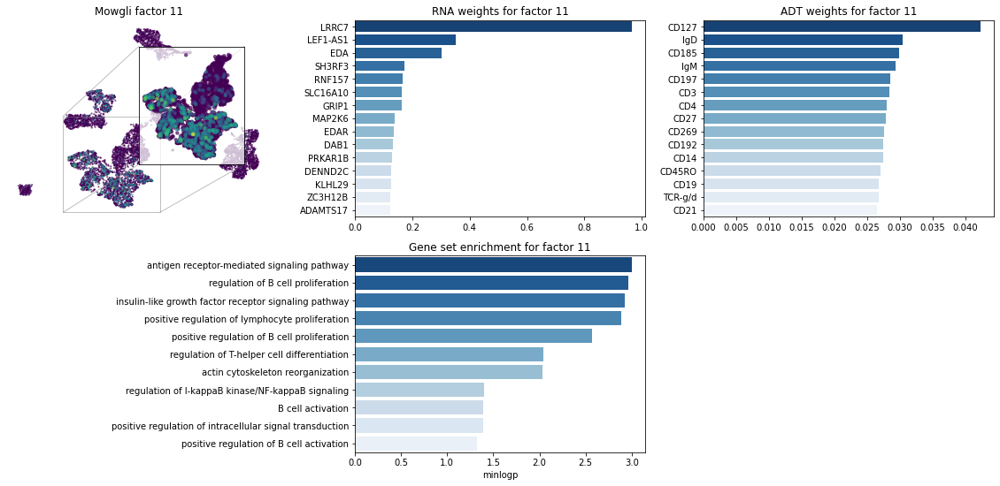

In [23]:
# Naive vs memory
plot_zoom(18, "CD4 T", s=75)
plot_zoom(8, "CD4 T", s=75)
plot_zoom(29, "CD4 T", s=75)
plot_zoom(11, "CD4 T", s=75)

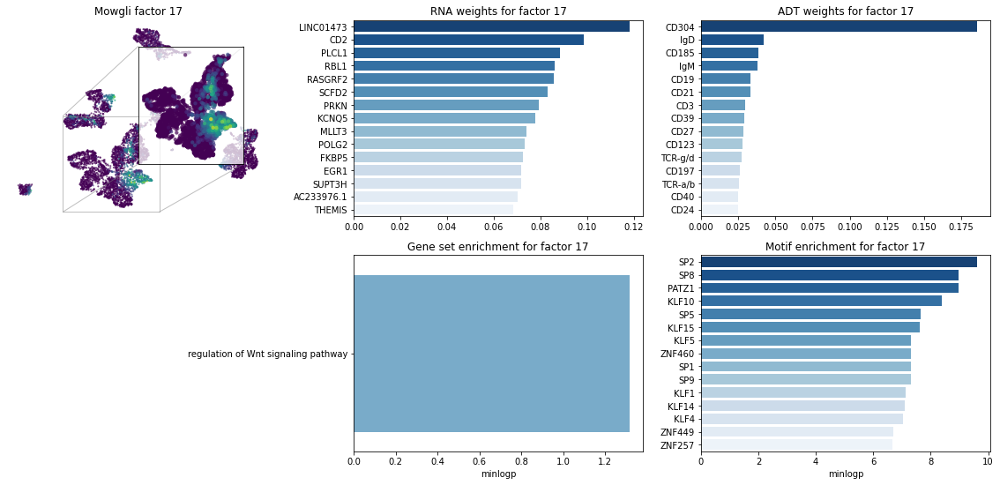

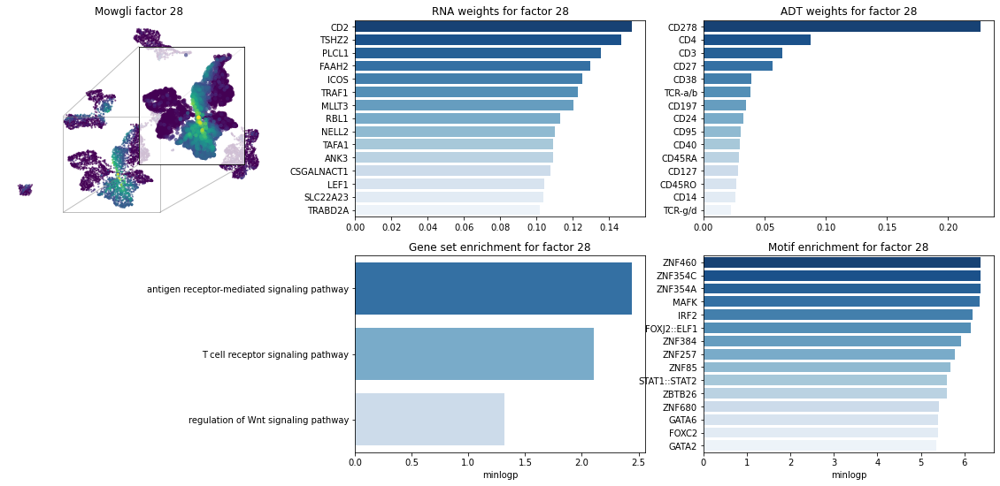

In [24]:
# Naive subsplit
plot_zoom(17, "CD4 T", s=75)
plot_zoom(28, "CD4 T", s=75)

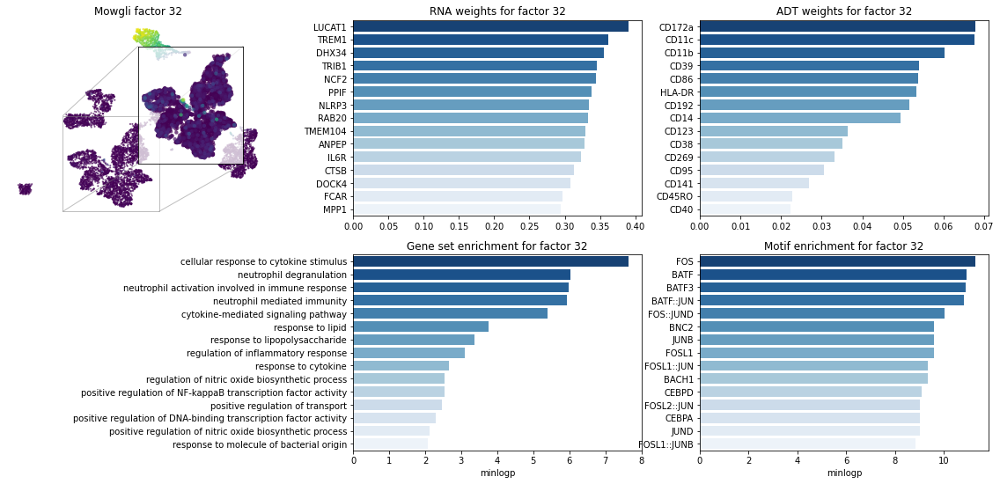

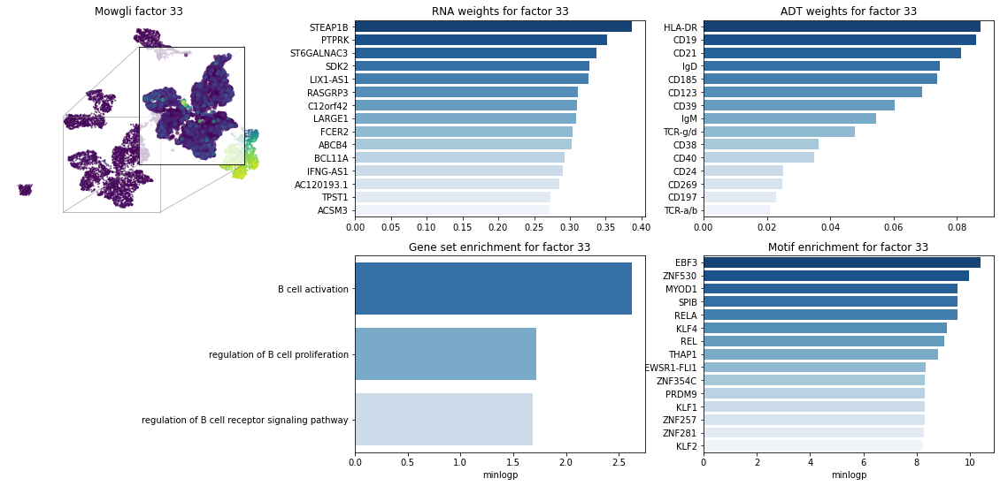

In [25]:
# ?
plot_zoom(32, "CD4 T", s=75)
plot_zoom(33, "CD4 T", s=75)

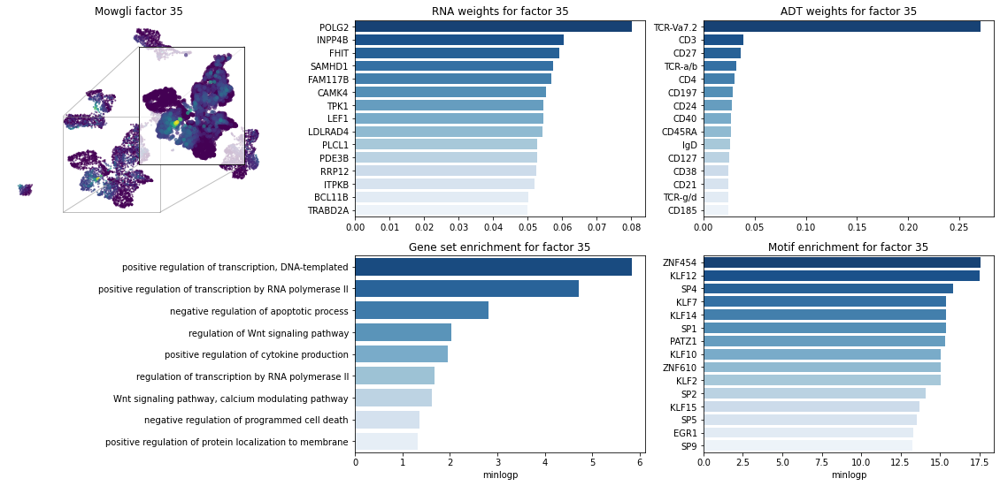

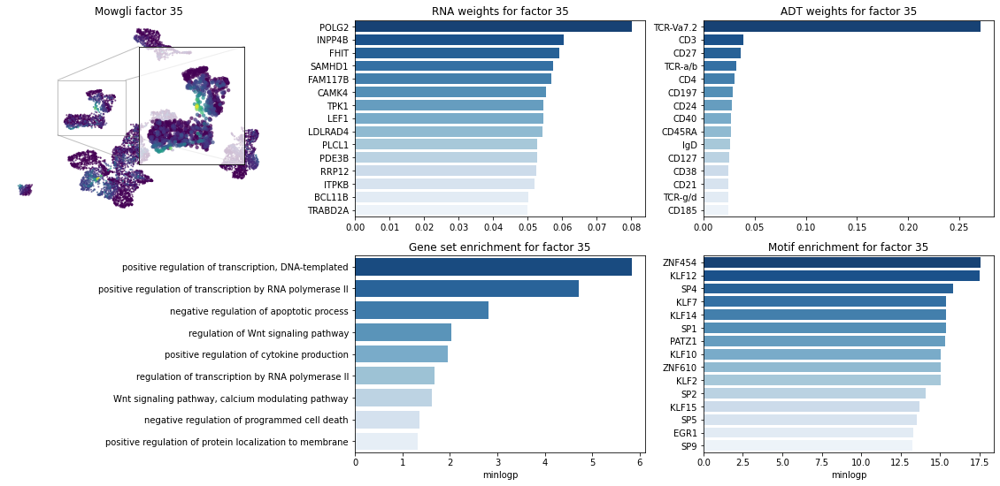

In [26]:
# NKT
plot_zoom(35, "CD4 T", s=75)
plot_zoom(35, "CD8 T", s=75)

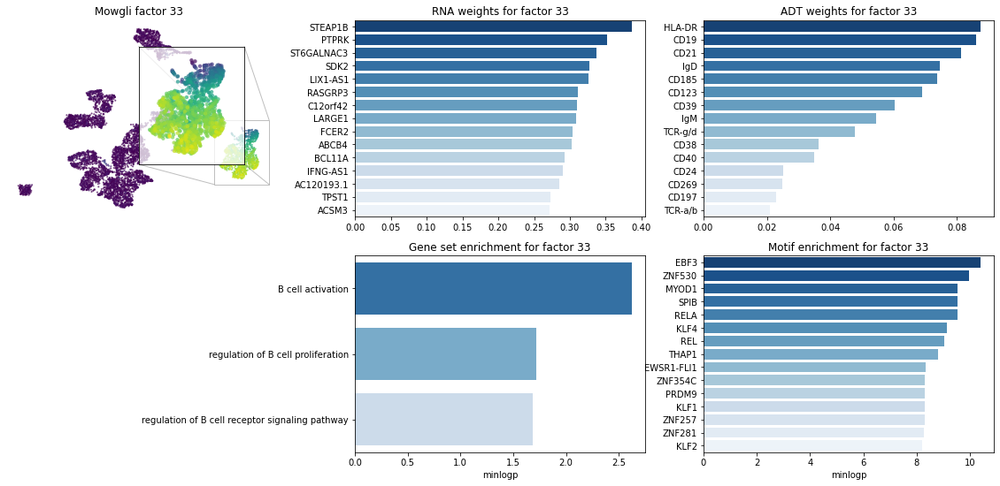

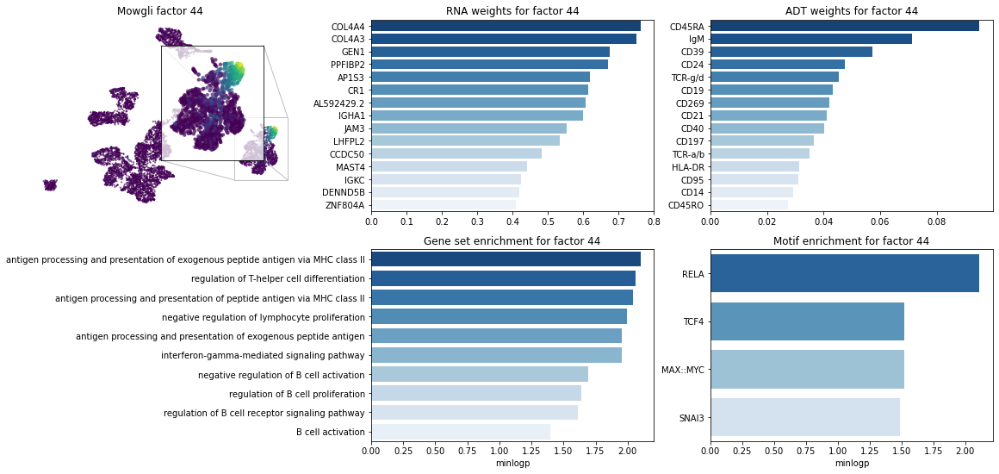

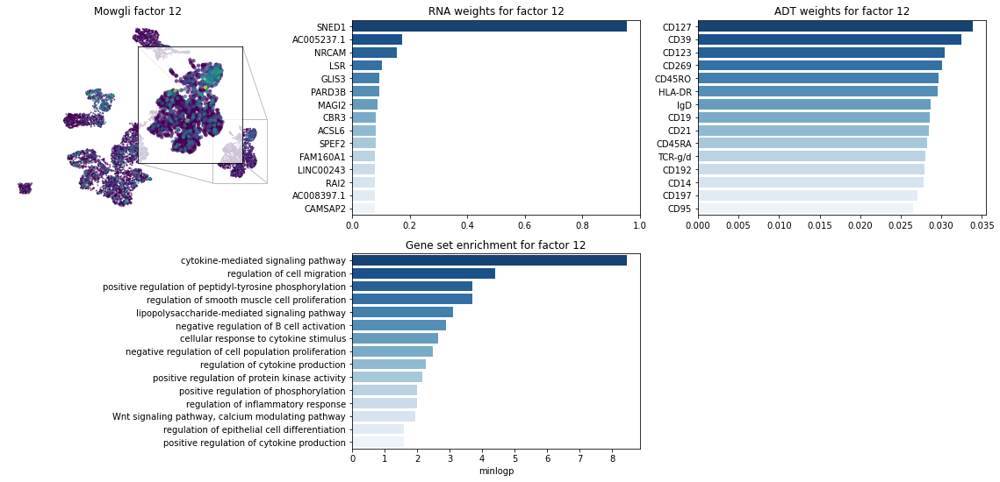

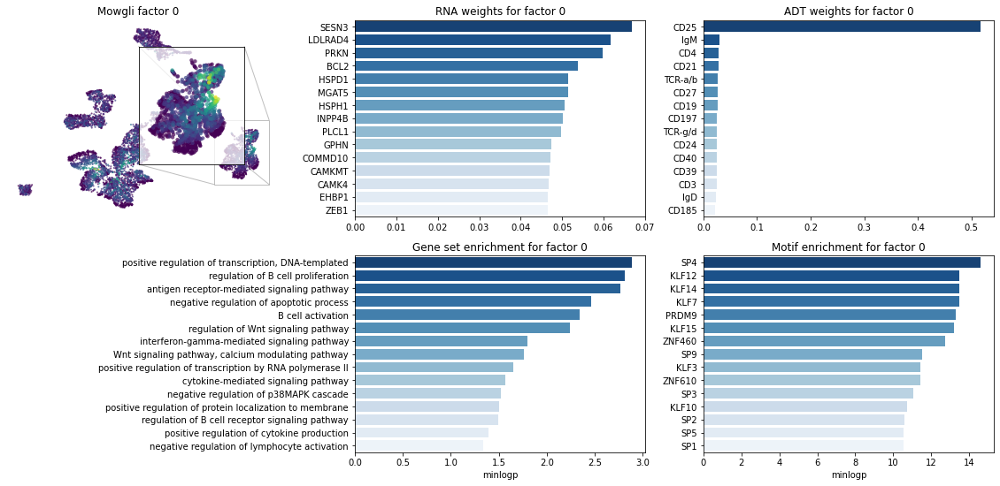

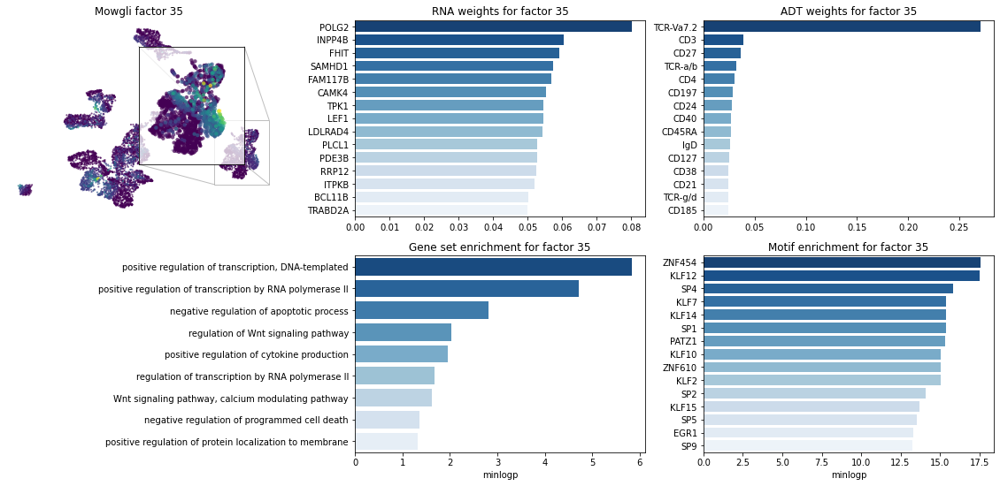

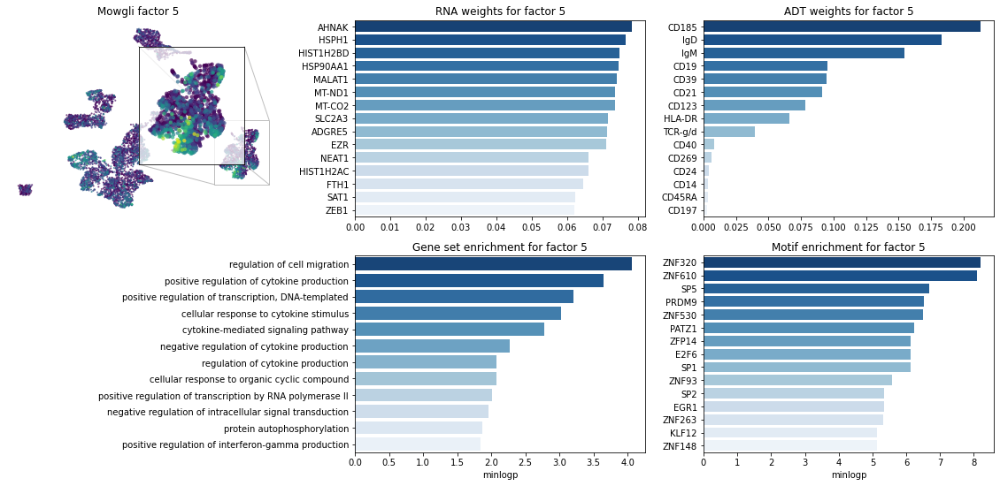

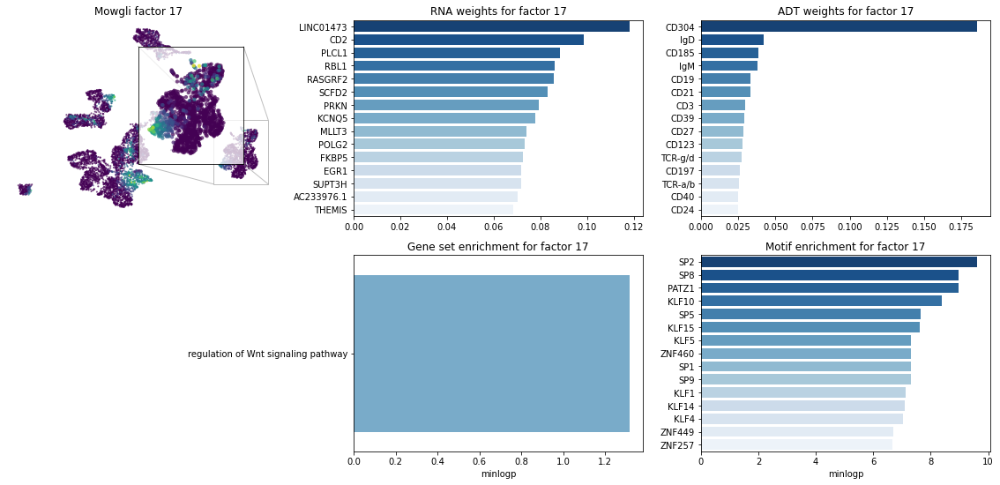

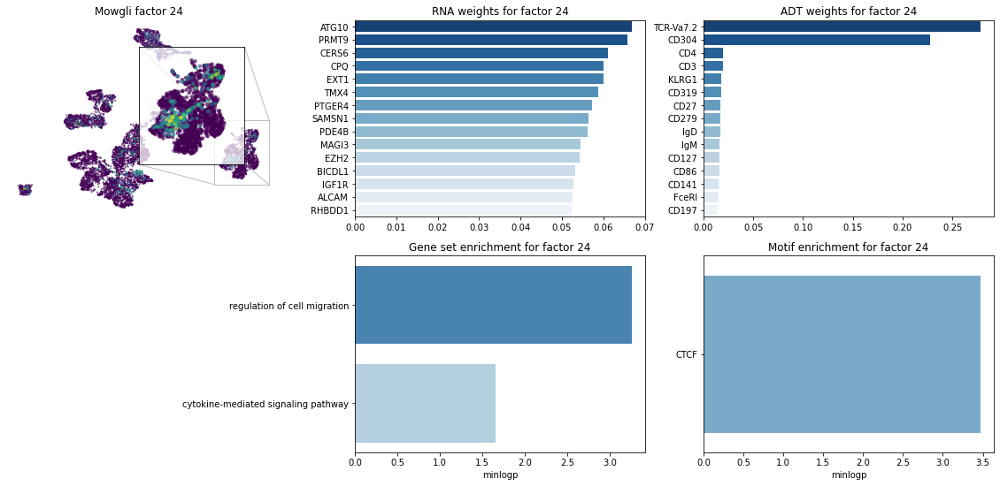

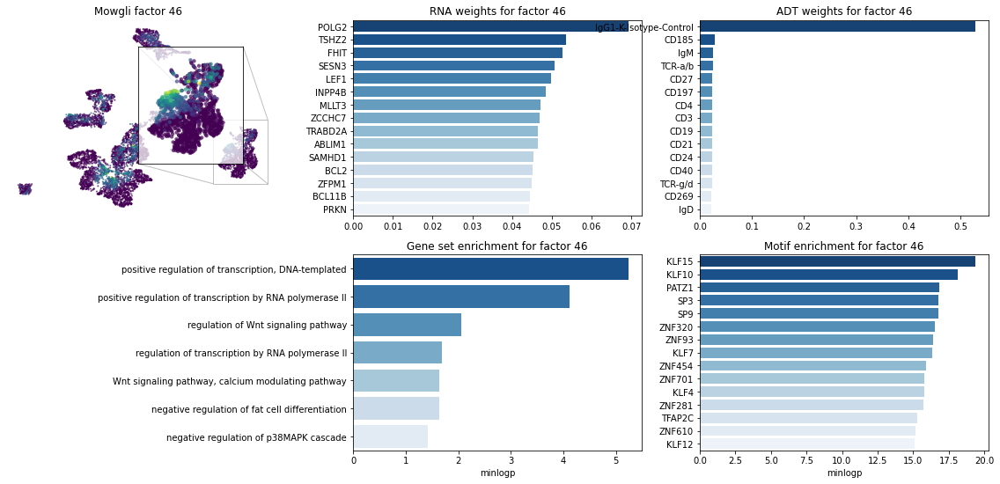

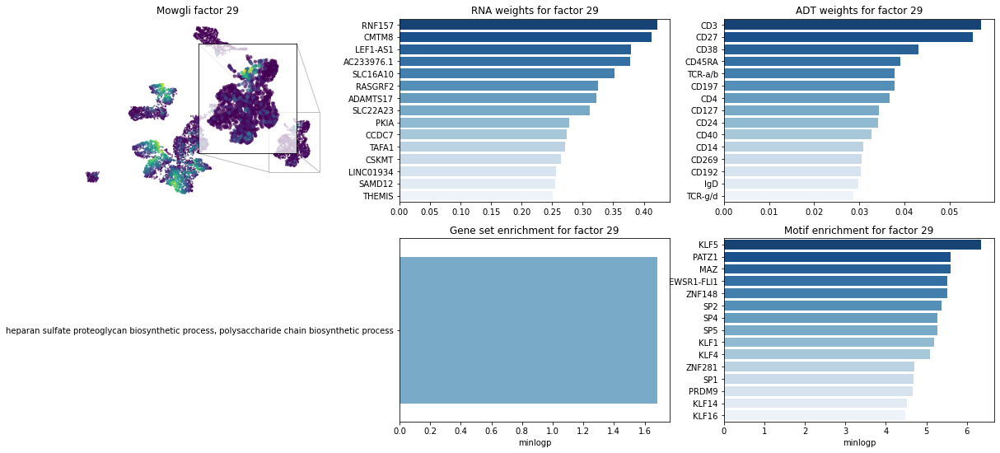

In [27]:
# Naive B cells
plot_zoom(33, "B cells", s=75)

# More B cells

# Activated / intermediate B cells
plot_zoom(44, "B cells", s=75)
plot_zoom(12, "B cells", s=75)

plot_zoom(0, "B cells", s=75)

plot_zoom(35, "B cells", s=75)

plot_zoom(5, "B cells", s=75)

plot_zoom(17, "B cells", s=75)
plot_zoom(24, "B cells", s=75)

plot_zoom(46, "B cells", s=75)

plot_zoom(29, "B cells", s=75)


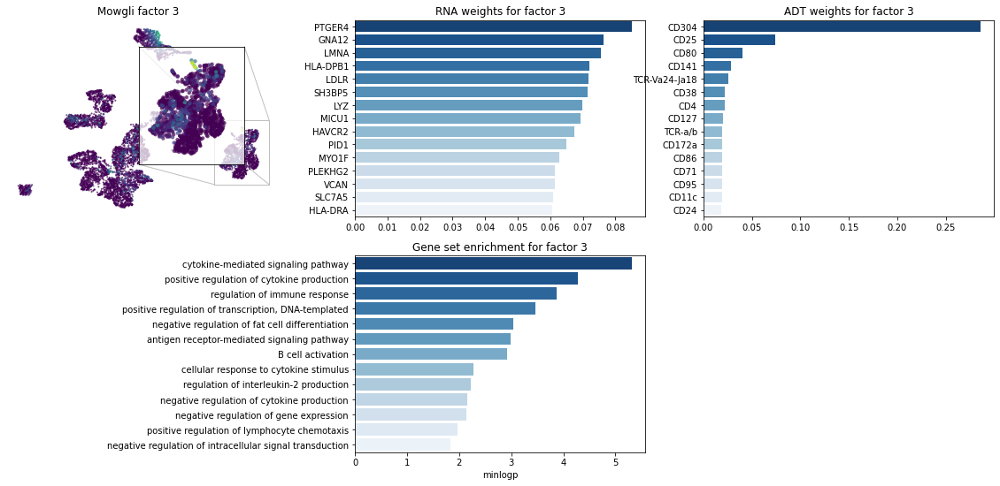

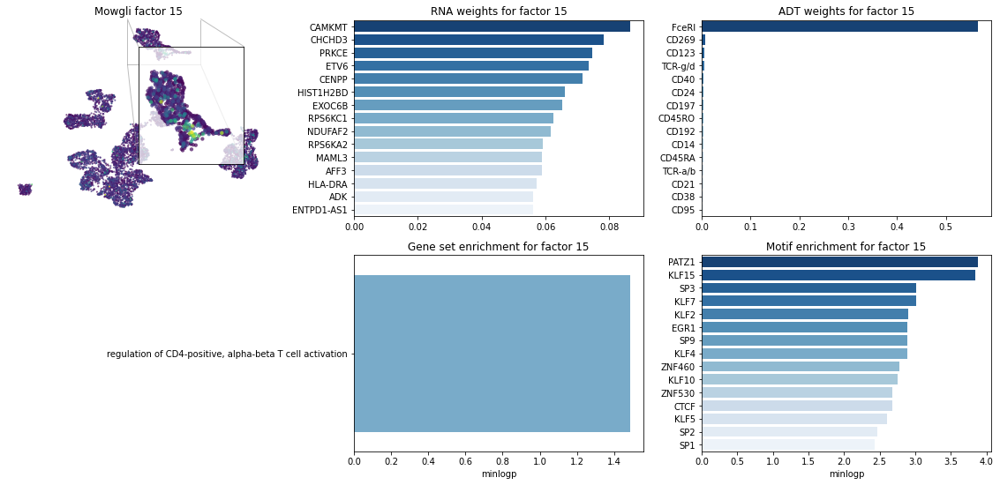

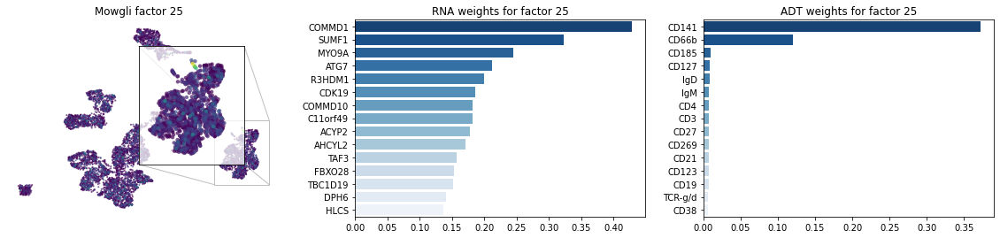

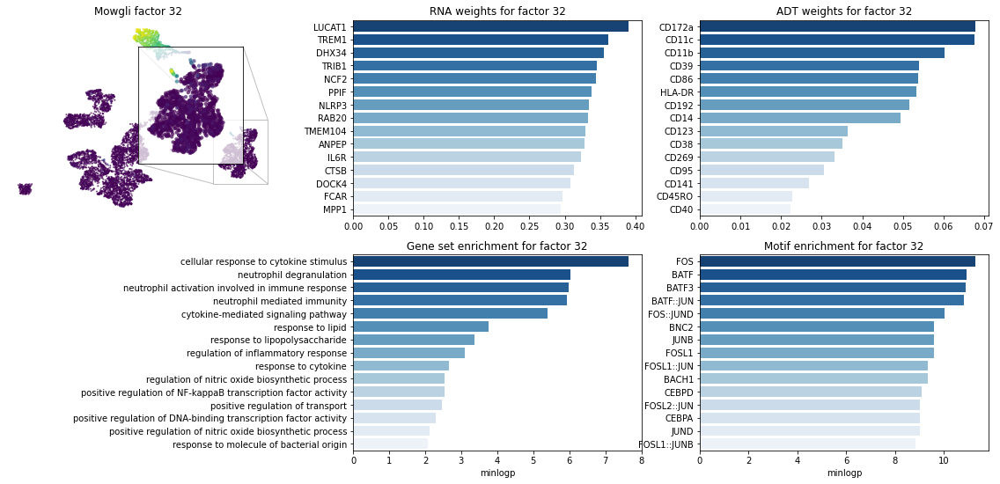

In [28]:
# Dendritic Cells
plot_zoom(3, "B cells", s=75)
plot_zoom(15, "Monocytes", s=75)
plot_zoom(25, "B cells", s=75)
plot_zoom(32, "B cells", s=75)

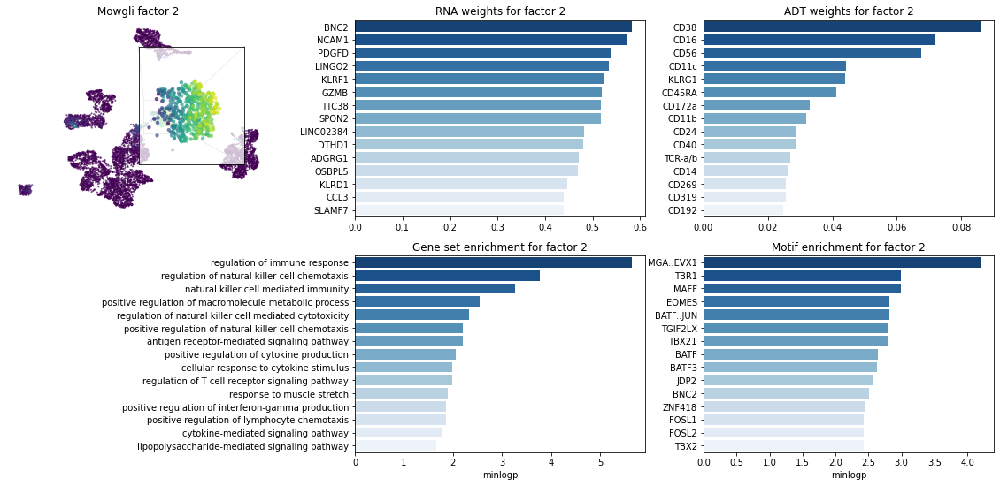

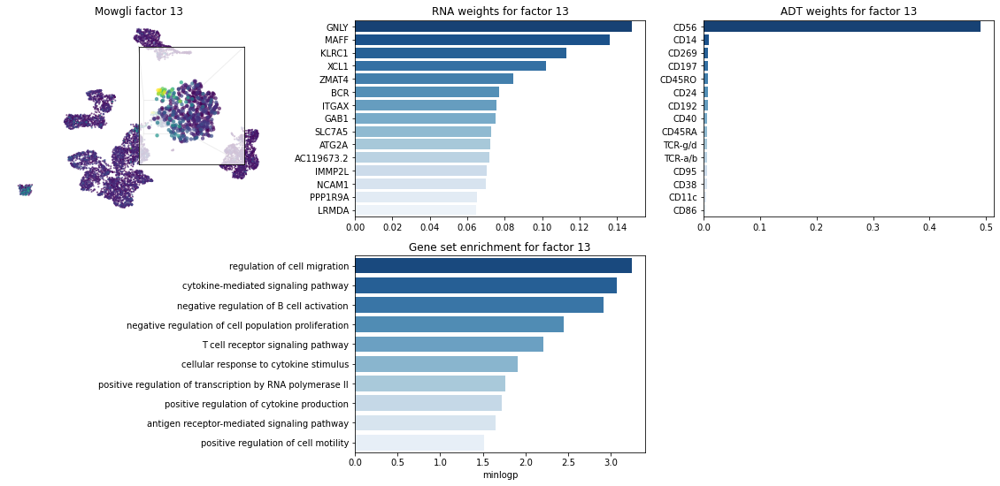

In [29]:
# NK cells
plot_zoom(2, "NK cells", s=75)
plot_zoom(13, "NK cells", s=75)
# plot_zoom(18, "NK cells", s=75)

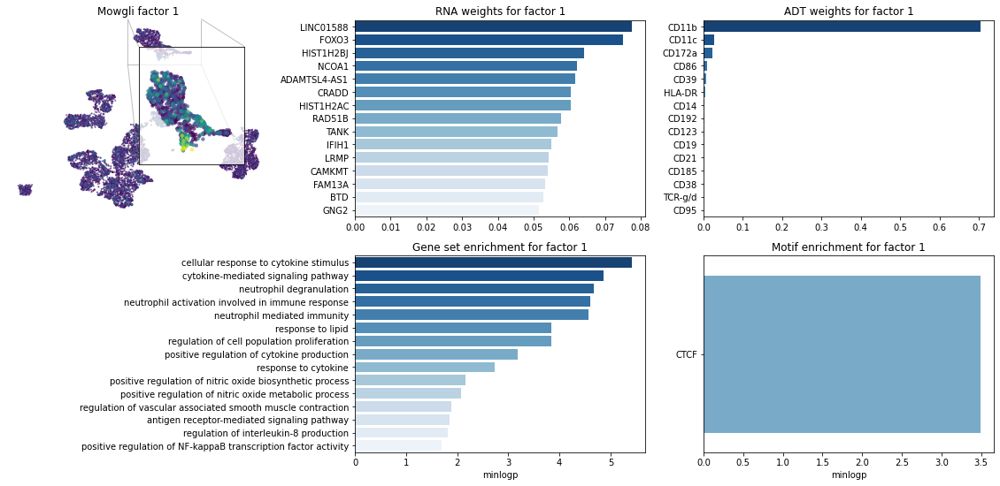

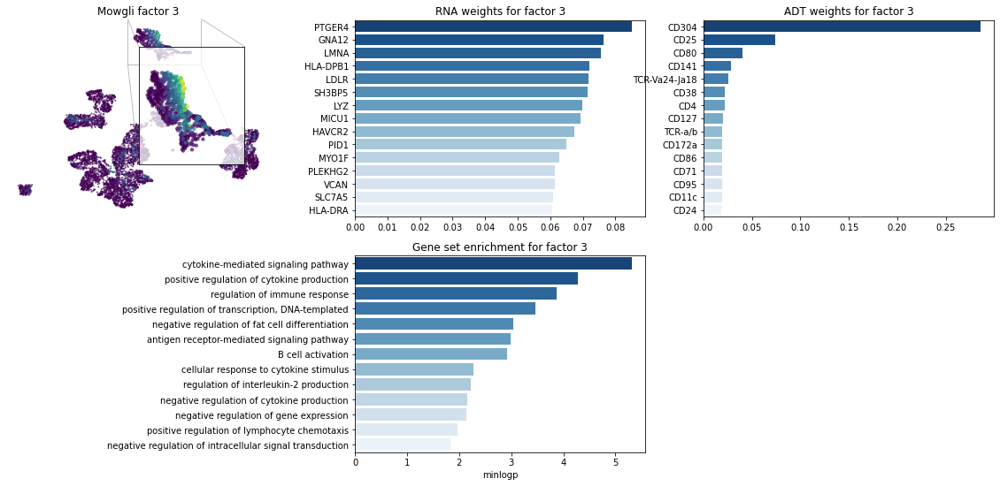

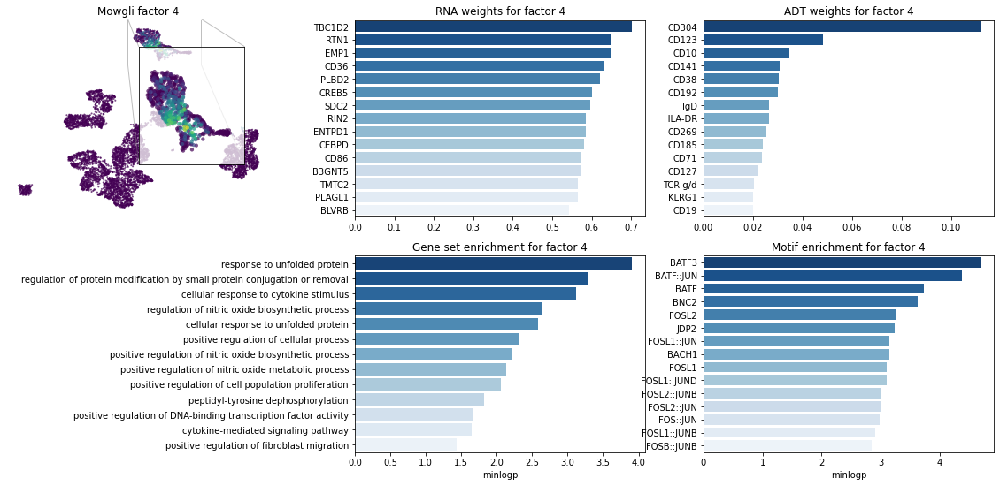

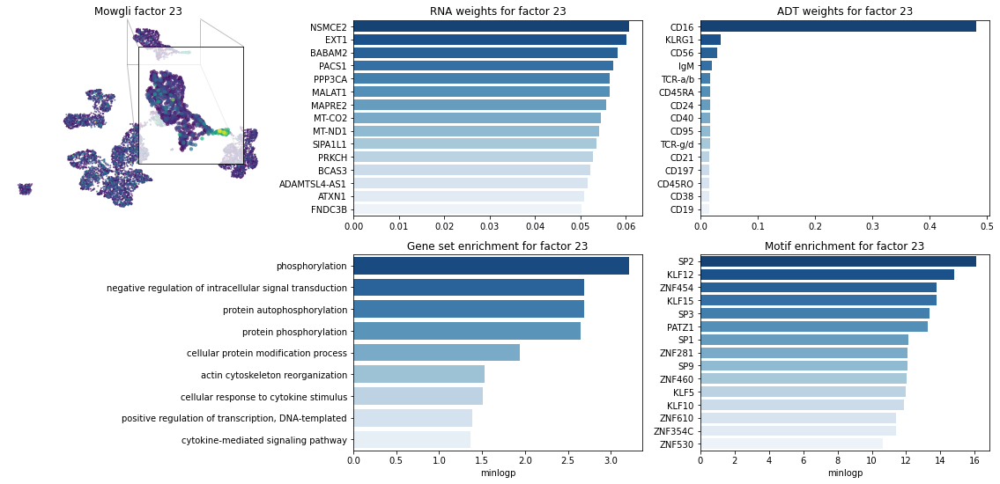

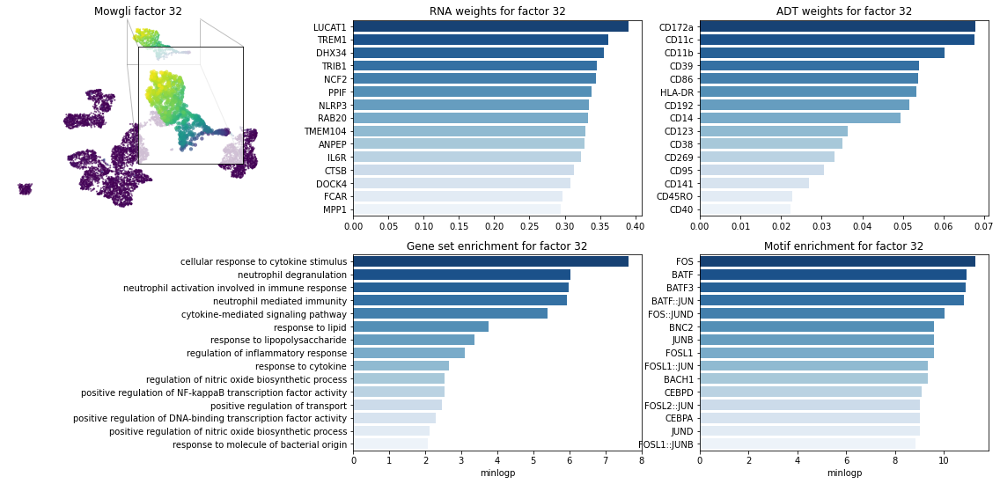

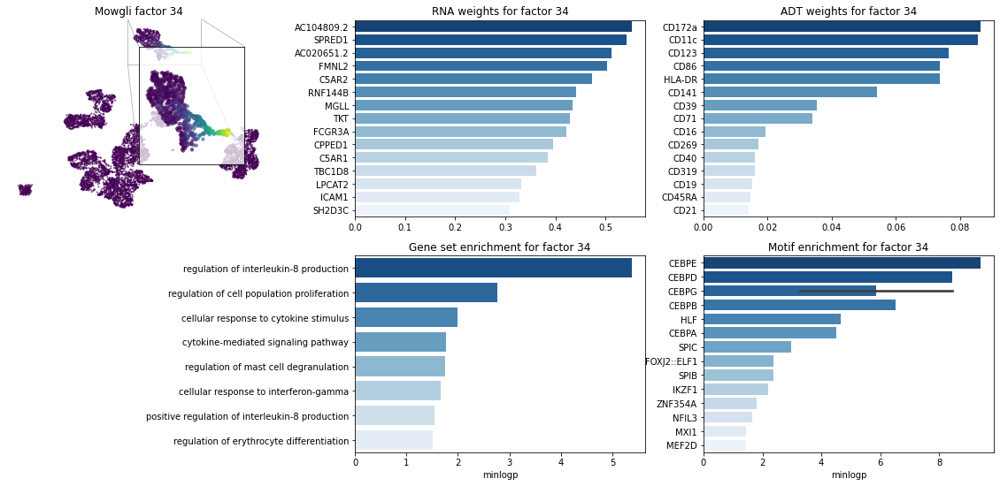

In [30]:
# Monocytes
plot_zoom(1, "Monocytes", s=75)
plot_zoom(3, "Monocytes", s=75)
plot_zoom(4, "Monocytes", s=75)
plot_zoom(23, "Monocytes", s=75)
plot_zoom(32, "Monocytes", s=75)
plot_zoom(34, "Monocytes", s=75)

In [39]:
print("\n".join(mdata["rna"].var_names.str.replace("rna:", "")[H_rna.X[:, 18].argsort()[::-1][:100]]))

SEMA4A
ICOS
HNRNPLL
EPHA4
NIBAN1
FAS
LRIG1
LMNA
CD2
PBX4
DUSP4
BICDL1
IFNG-AS1
ASTL
RGS1
GATA3
ARHGAP10
OASL
TRAF1
ZFYVE28
CYTOR
IFIH1
ANK3
TGFBR3
PLEKHG2
ITGB1
SAMSN1
DUSP16
PTGER4
PRMT9
FAAH2
NCALD
ADAM19
GPRIN3
IL21R
PDE4B
ZFPM1
NR4A3
MIAT
ANXA1
UST
ATG2A
SPDYA
TRIM69
ERN1
PGAP1
MCOLN2
AC020916.1
RNF125
NFATC1
SMAD3
PAM
IL2RA
PHACTR2
LDLR
PRKX
AC068587.4
PFKFB3
GCH1
SLC7A5
ADAMTSL4-AS1
CEACAM21
TNFRSF1B
MB21D2
MAF
ATXN1
PLCB1
NEDD9
TRBC1
IL4R
KIF5C
TAFA1
MCF2L2
FRMD4B
GPHN
PCAT1
AC074099.1
BTBD11
TNFAIP3
MYBL1
ARID5B
INPP4B
TANK
RUNX3
RUNX2
CASK
MYO1F
COTL1
PIK3R1
AL136456.1
EDARADD
RORA
PPP1R16B
GNAQ
SLC16A1
HERC5
DGKH
TNF
AHNAK
GRK5
